In [ ]:
!pip install torch torchvision transformers diffusers accelerate

In [ ]:
from PIL import Image
from IPython.display import display
from IPython.display import clear_output
import torch
from transformers import BlipProcessor, BlipForConditionalGeneration
from diffusers import StableDiffusionXLPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)


pipe = StableDiffusionXLPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0",torch_dtype=torch.float16).to(device)

In [18]:
def image_to_caption(image_path):
    raw_image = Image.open(image_path).convert("RGB")
    inputs = processor(raw_image, return_tensors="pt").to(device)

    out = model.generate(
        **inputs,
        min_length=30,
        max_length=100,
        num_beams=5,
        no_repeat_ngram_size=2,
        early_stopping=True
    )

    caption = processor.decode(out[0], skip_special_tokens=True)
    return caption


def caption_to_image(caption, output_path):
    image = pipe(prompt=caption).images[0]
    image.save(output_path)
    return output_path

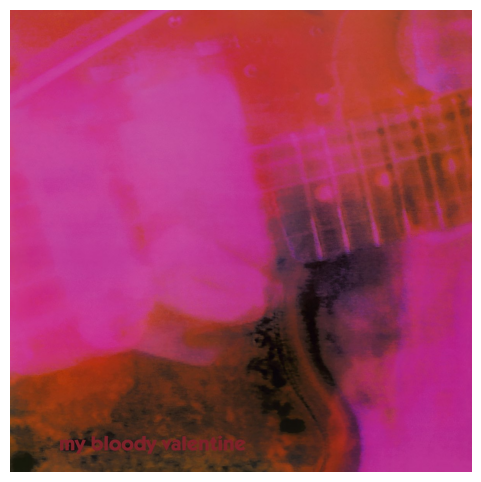

Step 1
Caption: a painting of a guitar on a pink and orange background with the words, my body is in the air, and the guitar is out, on the ground


  0%|          | 0/50 [00:00<?, ?it/s]

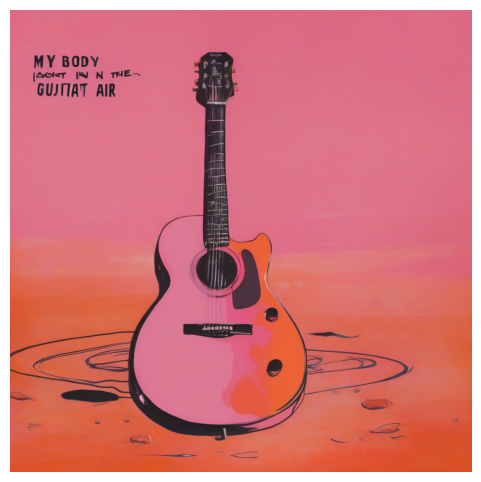

Step 2
Caption: a painting of a pink guitar in a puddle of water with the words ' my body is a guitar ' written in black on the top of the guitar


  0%|          | 0/50 [00:00<?, ?it/s]

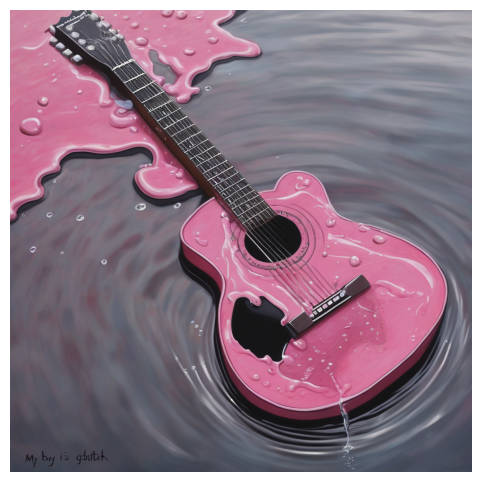

Step 3
Caption: a pink guitar floating in the water with a splash of pink paint on the top of the guitar ' s body and a black and white fre


  0%|          | 0/50 [00:00<?, ?it/s]

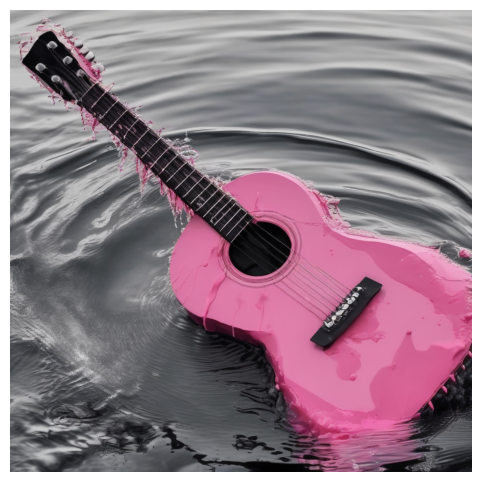

Step 4
Caption: a pink guitar floating in the water with a splash of water on the top and bottom of the guitar ' s body, as if it is pink


  0%|          | 0/50 [00:00<?, ?it/s]

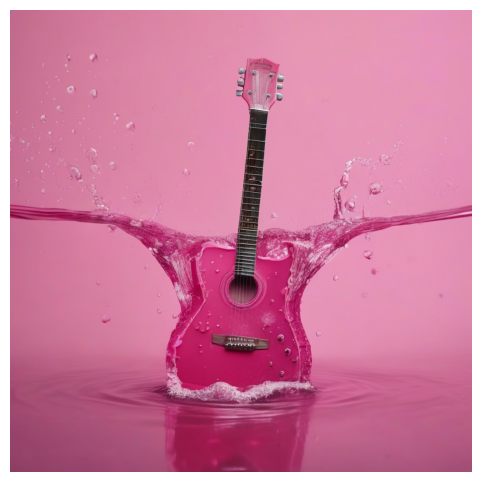

Step 5
Caption: a pink guitar splashing into the water with a splash of water on the top of the guitar, on a bright pink background with copy - space


  0%|          | 0/50 [00:00<?, ?it/s]

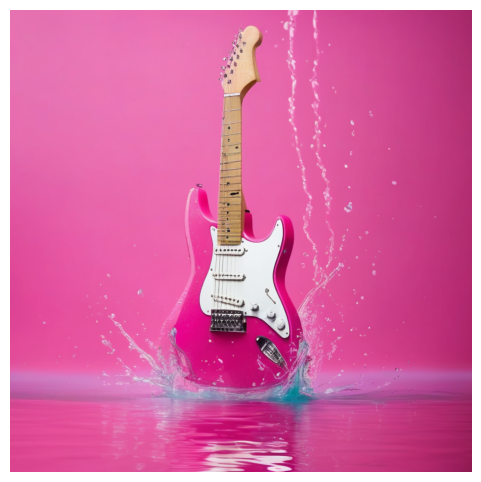

Step 6
Caption: a pink electric guitar splashing in the water on a bright pink background with a splash of water from the top of the neck and neck of a guitar


  0%|          | 0/50 [00:00<?, ?it/s]

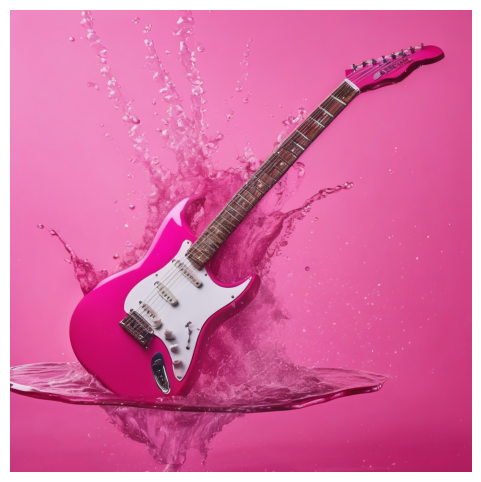

Step 7
Caption: a pink electric guitar splashing into the water on a bright pink background stock photo - images and stock photos - fotos de fulg


  0%|          | 0/50 [00:00<?, ?it/s]

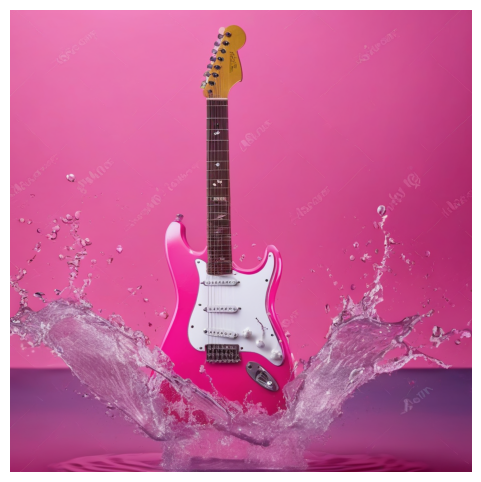

Step 8
Caption: pink electric guitar with splashing water on pink background premium premium stockphation - image of a guitar in the water with a splash of water stock


  0%|          | 0/50 [00:00<?, ?it/s]

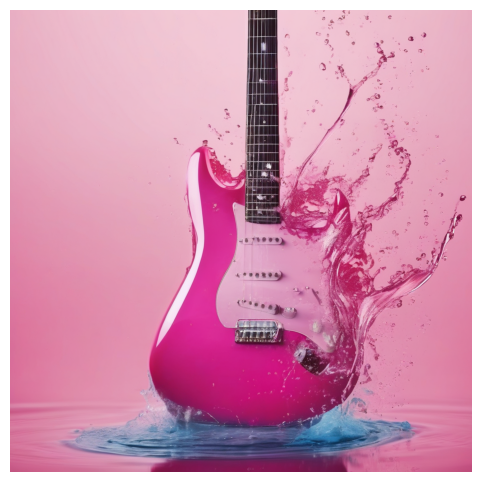

Step 9
Caption: a pink electric guitar splashing into the water with a splash of water on the top of the guitar, on a bright pink background stock photo -


  0%|          | 0/50 [00:00<?, ?it/s]

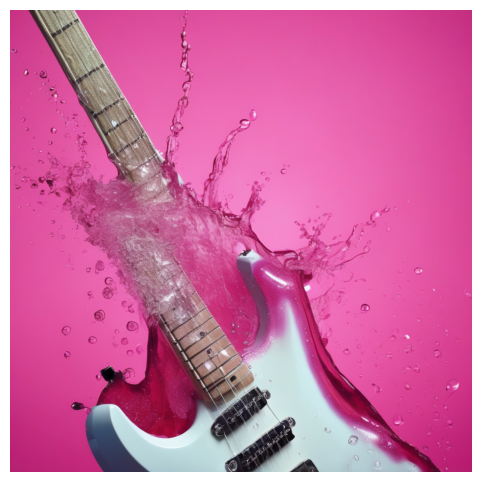

Step 10
Caption: an electric guitar with a splash of water on it ' s body, on a pink background stock photo - 1387993 - 1 -


  0%|          | 0/50 [00:00<?, ?it/s]

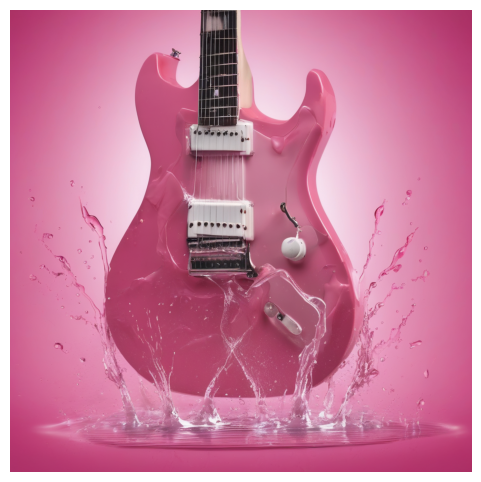

Step 11
Caption: a pink electric guitar with water splashing on the top and a white guitar in the middle of the image is a splash of pink water on a


  0%|          | 0/50 [00:00<?, ?it/s]

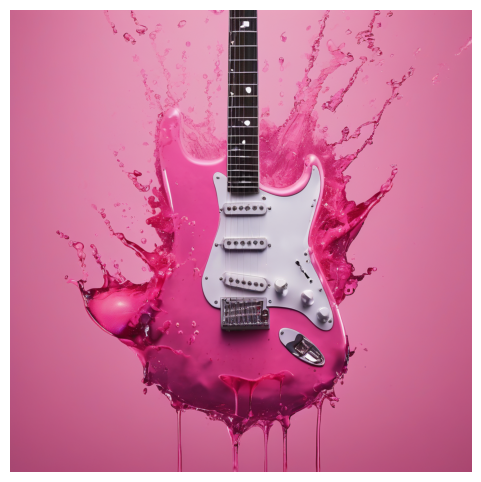

Step 12
Caption: a pink guitar with a splash of pink paint on the top and bottom of the guitar ' s body, on a bright pink background with pink water splash


  0%|          | 0/50 [00:00<?, ?it/s]

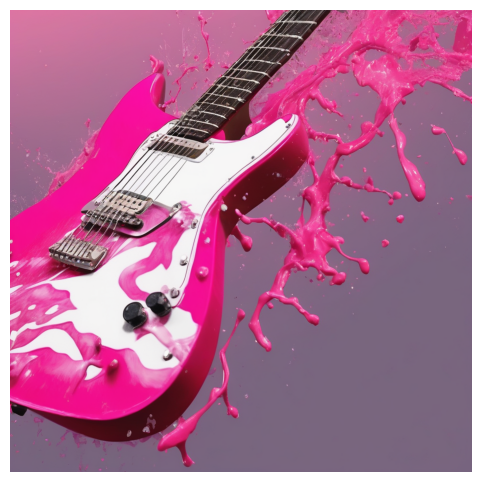

Step 13
Caption: a pink guitar with a splash of paint on the body and neck, on a gray background with pink paint splashing around the neck stock photo -


  0%|          | 0/50 [00:00<?, ?it/s]

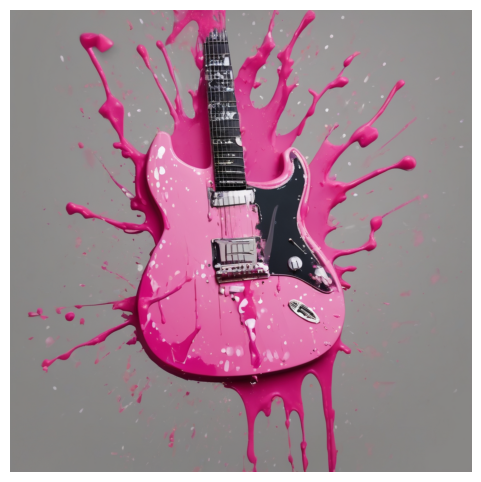

Step 14
Caption: a pink guitar with a splash of paint on the body and a black guitar in the middle of the image is a grey background with white spots and gray


  0%|          | 0/50 [00:00<?, ?it/s]

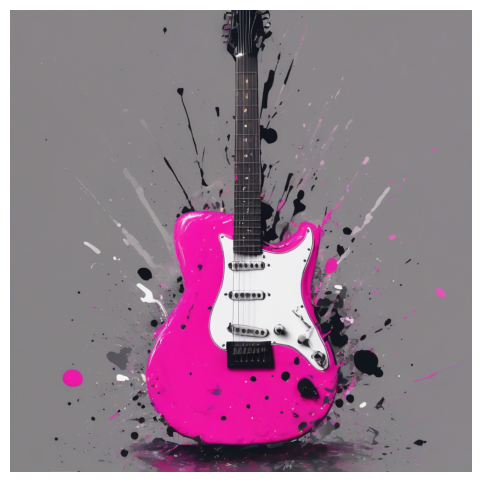

Step 15
Caption: a pink electric guitar with a splash of paint on the body and a black and white guitar in the middle of the image is a gray background -


  0%|          | 0/50 [00:00<?, ?it/s]

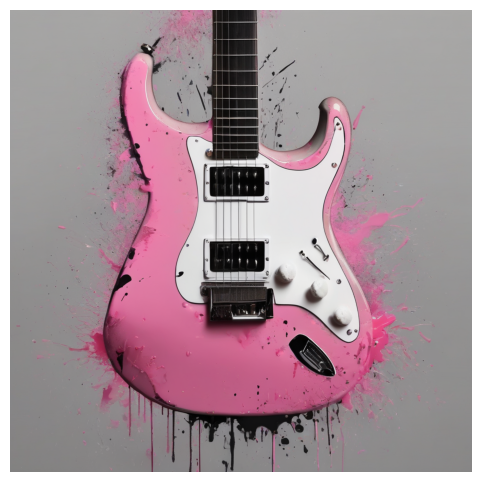

In [8]:
import matplotlib.pyplot as plt

image = "/content/loveless.jpg"
imaged = Image.open(image).convert("RGB")
plt.figure(figsize=(6,6))
plt.axis('off')
plt.imshow(imaged)
plt.show()

for i in range(15):
    print(f"Step {i+1}")

    caption = image_to_caption(image)
    print(f"Caption: {caption}")

    output_image = f"loveless_step_{i+1}.png"
    image = caption_to_image(caption,output_image)

    imaged = Image.open(image).convert("RGB")
    plt.figure(figsize=(6,6))
    plt.axis('off')
    plt.imshow(imaged)
    plt.show()

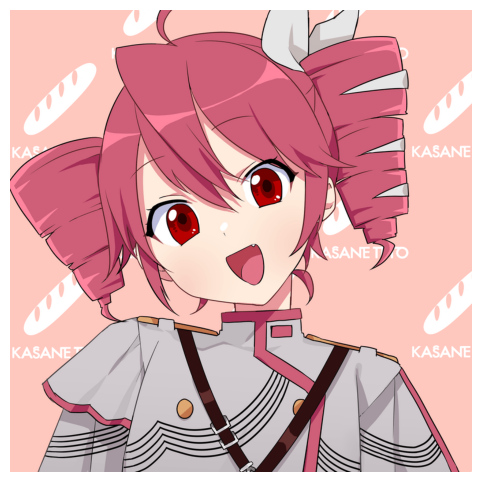

Step 1
Caption: an anime girl with pink hair and red eyes, wearing a gray outfit with a bow around her neck and a pink bow on her head, standing in front view


  0%|          | 0/50 [00:00<?, ?it/s]

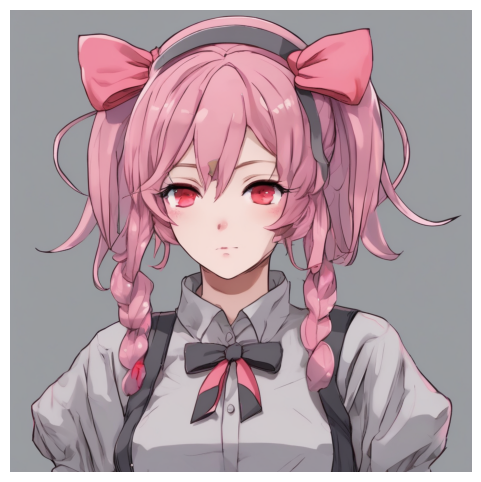

Step 2
Caption: an anime girl with pink hair and a bow on her head, wearing a grey shirt and black pants, a pink bow around her neck, and red eyes


  0%|          | 0/50 [00:00<?, ?it/s]

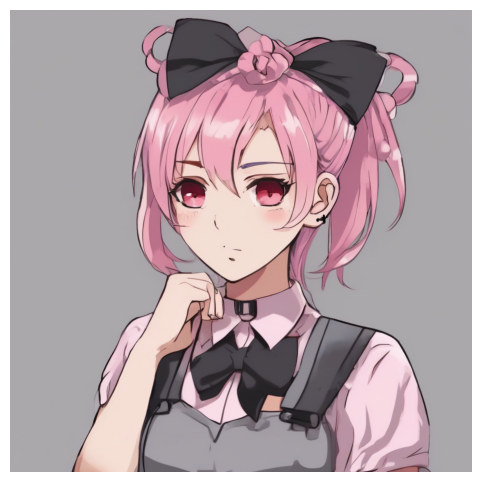

Step 3
Caption: a girl with pink hair and a bow on her head, wearing a pink shirt and black suspends, a black bow around her neck, and pink eyes


  0%|          | 0/50 [00:00<?, ?it/s]

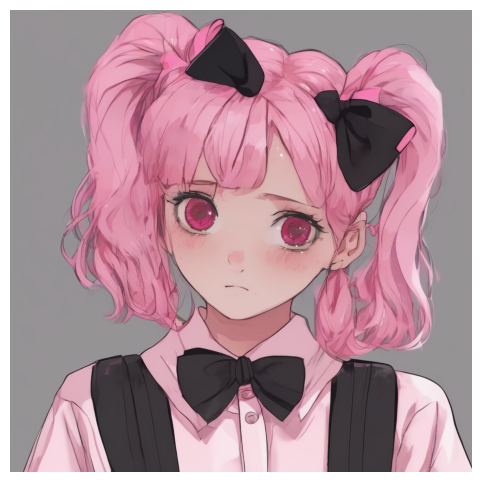

Step 4
Caption: a drawing of a girl with pink hair and a black bow, wearing a white shirt and suspends, a pink shirt, and black suspend and


  0%|          | 0/50 [00:00<?, ?it/s]

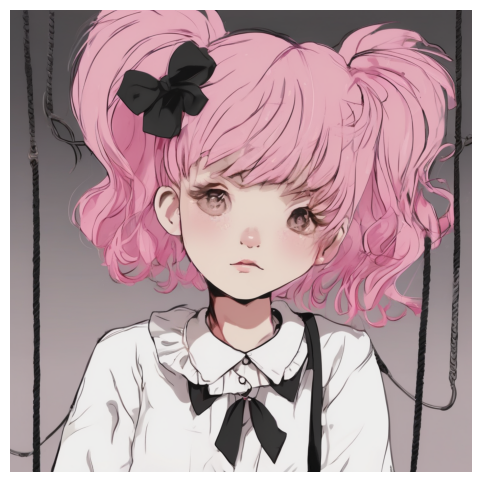

Step 5
Caption: a girl with pink hair and a black bow on her head, sitting on a swing with her hands behind her back and looking at the camera -


  0%|          | 0/50 [00:00<?, ?it/s]

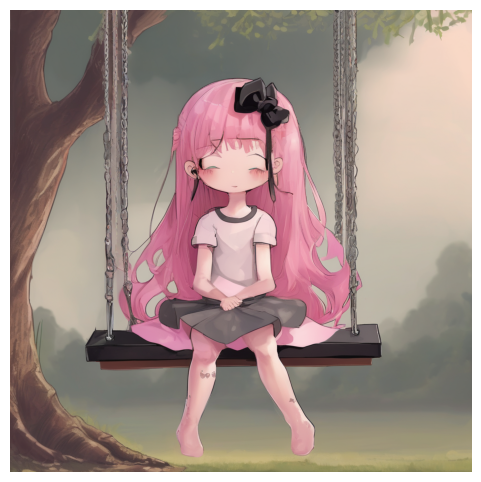

Step 6
Caption: a girl sitting on a swing with pink hair and a black bow on her head, wearing a white shirt, black pants, and black shoes -


  0%|          | 0/50 [00:00<?, ?it/s]

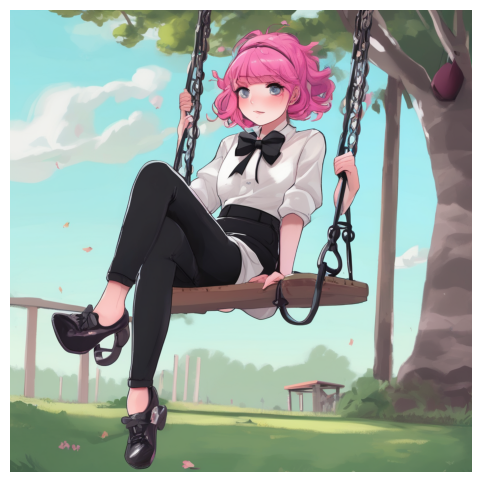

Step 7
Caption: a girl sitting on a swing with pink hair and black pants, a white shirt, black shoes, and a black bow tie, in front of a tree


  0%|          | 0/50 [00:00<?, ?it/s]

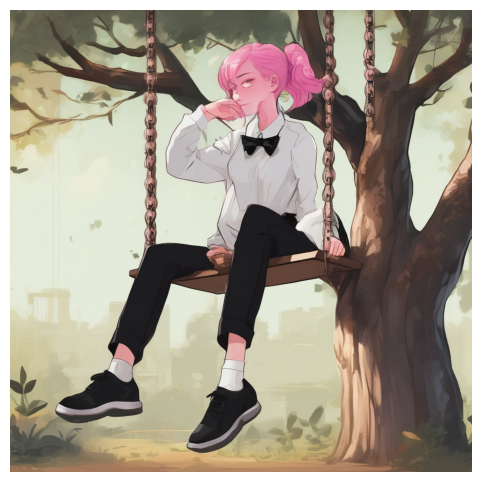

Step 8
Caption: a girl with pink hair sitting on a swing in a park, wearing a white shirt, black pants, and a bow tie and black shoes,


  0%|          | 0/50 [00:00<?, ?it/s]

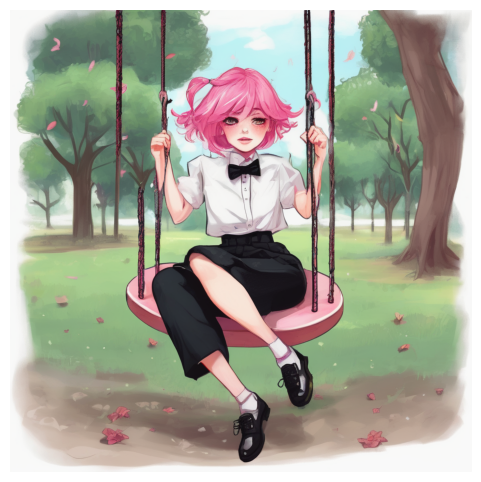

Step 9
Caption: a girl sitting on a swing with pink hair and a bow tie around her neck, wearing a white shirt, black skirt, and black shoes -


  0%|          | 0/50 [00:00<?, ?it/s]

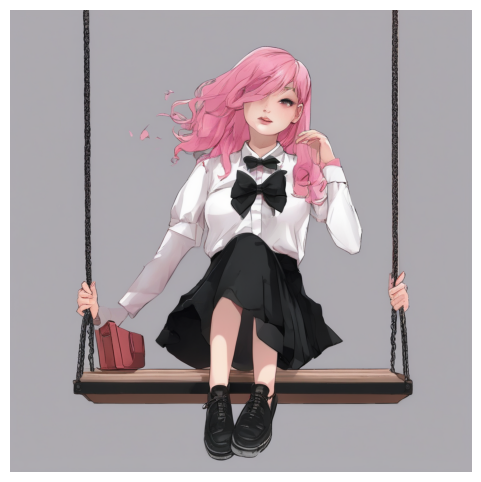

Step 10
Caption: a girl sitting on a swing with pink hair and black shoes, wearing a white shirt, black skirt, and a black bowtied shirt on


  0%|          | 0/50 [00:00<?, ?it/s]

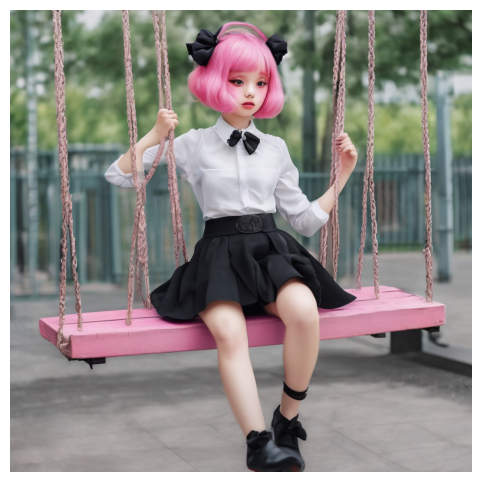

Step 11
Caption: a little girl sitting on a swing with pink hair and a bow on her head, wearing a white shirt, black skirt, and black shoes -


  0%|          | 0/50 [00:00<?, ?it/s]

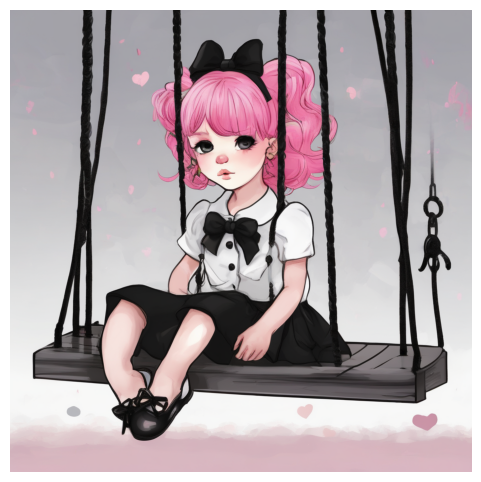

Step 12
Caption: a girl sitting on a swing with pink hair and a bow on her head, wearing a white shirt, black skirt and black bow tie, and bow


  0%|          | 0/50 [00:00<?, ?it/s]

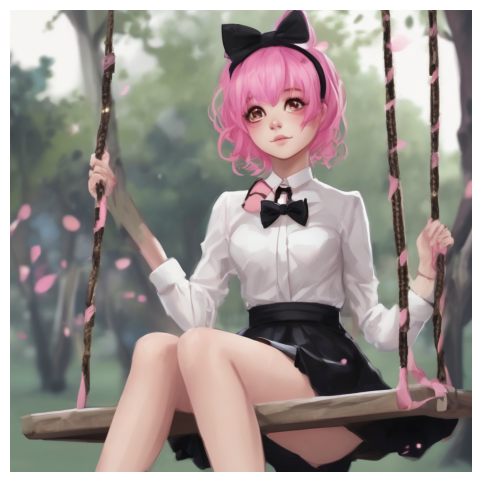

Step 13
Caption: a girl sitting on a swing with pink hair and a bow tie around her neck, wearing a white shirt, black skirt, and black shoes -


  0%|          | 0/50 [00:00<?, ?it/s]

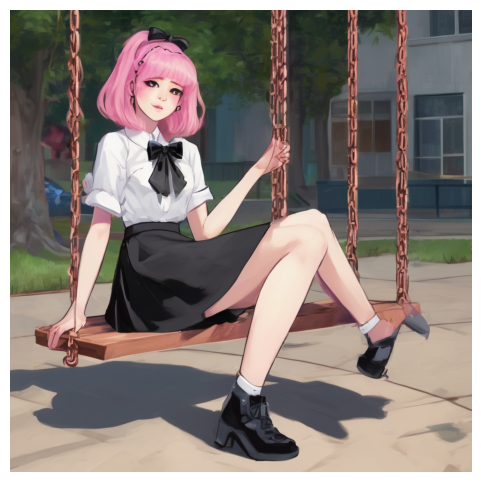

Step 14
Caption: a girl sitting on a swing with a pink hair and a black tie around her neck, wearing a white shirt, black skirt and black shoes, and white socks


  0%|          | 0/50 [00:00<?, ?it/s]

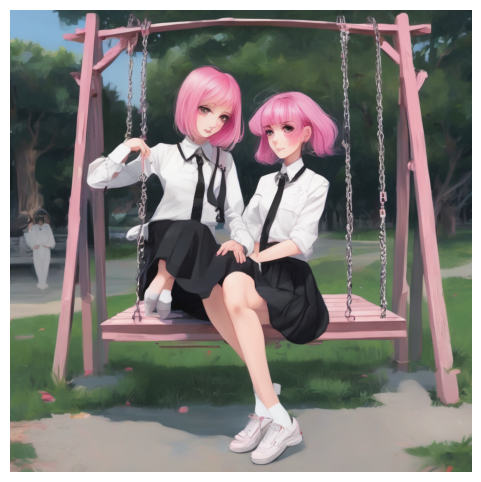

Step 15
Caption: two girls sitting on a swing with pink hair and white shoes, one wearing a white shirt and the other in a black dress and tie, both wearing white sneakers


  0%|          | 0/50 [00:00<?, ?it/s]

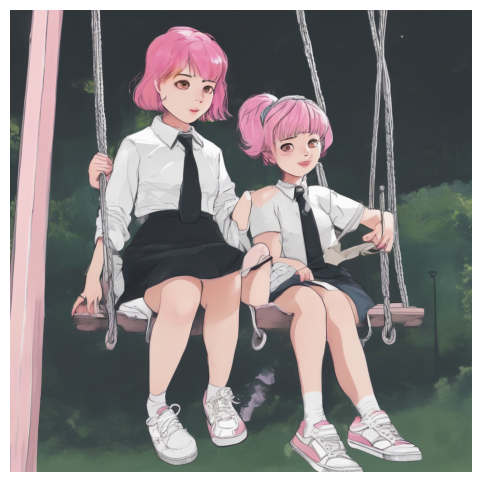

In [10]:
image = "/content/teto.png"
imaged = Image.open(image).convert("RGB")
plt.figure(figsize=(6,6))
plt.axis('off')
plt.imshow(imaged)
plt.show()

for i in range(15):
    print(f"Step {i+1}")

    caption = image_to_caption(image)
    print(f"Caption: {caption}")

    output_image = f"teto_step_{i+1}.png"
    image = caption_to_image(caption,output_image)

    imaged = Image.open(image).convert("RGB")
    plt.figure(figsize=(6,6))
    plt.axis('off')
    plt.imshow(imaged)
    plt.show()